
# How to Train YOLO11 Object Detection on a Custom Dataset

---

YOLO11 builds on the advancements introduced in YOLOv9 and YOLOv10 earlier this year, incorporating improved architectural designs, enhanced feature extraction techniques, and optimized training methods.

YOLO11m achieves a higher mean mAP score on the COCO dataset while using 22% fewer parameters than YOLOv8m, making it computationally lighter without sacrificing performance.

YOLOv11 is available in 5 different sizes, ranging from `2.6M` to `56.9M` parameters, and capable of achieving from `39.5` to `54.7` mAP on the COCO dataset.

## Setup

### Configure API keys

To fine-tune YOLO11, you need to provide your Roboflow API key. Follow these steps:

- Go to your [`Roboflow Settings`](https://app.roboflow.com/settings/api) page. Click `Copy`. This will place your private key in the clipboard.
- In Colab, go to the left pane and click on `Secrets` (🔑). Store Roboflow API Key under the name `ROBOFLOW_API_KEY`.

### Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [1]:
from google.colab import userdata
api = userdata.get('ROBOFLOW_API_KEY')

In [2]:
!nvidia-smi

Sat Aug  9 06:34:22 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   64C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content


## Install YOLO11 via Ultralytics

In [4]:
%pip install ultralytics supervision roboflow
import ultralytics
ultralytics.checks()

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 43.3/112.6 GB disk)


## Inference with model pre-trained on custom dataset

**NOTE:** Result annotated image got saved in `{HOME}/runs/detect/predict/`. Let's display it.

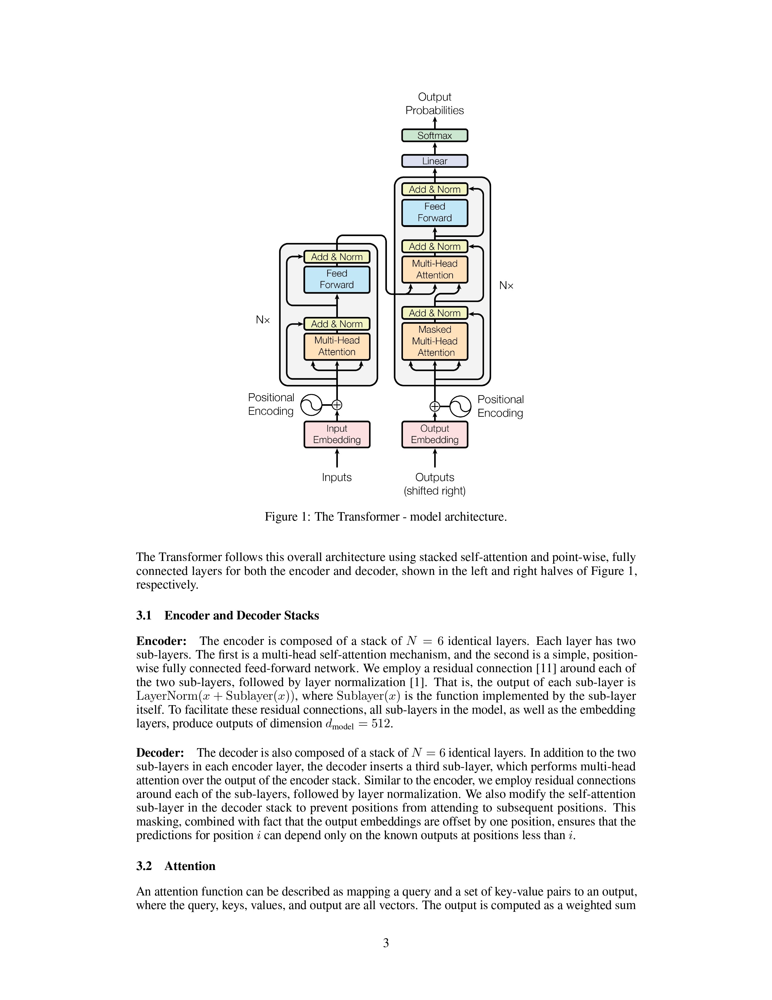

In [7]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/1706.03762_page-0001.jpg', width=600)

# Load Model

In [8]:
from ultralytics import YOLO
from PIL import Image
import requests

model = YOLO('yolo11n.pt')
image = Image.open('/content/1706.03762_page-0001.jpg')
result = model.predict(image, conf=0.25)[0]


0: 640x512 (no detections), 43.2ms
Speed: 25.5ms preprocess, 43.2ms inference, 138.7ms postprocess per image at shape (1, 3, 640, 512)


**NOTE:** The obtained `result` object stores information about the location, classes, and confidence levels of the detected objects.

In [9]:
result.boxes.xyxy

tensor([], device='cuda:0', size=(0, 4))

In [10]:
result.boxes.conf

tensor([], device='cuda:0')

In [11]:
result.boxes.cls

tensor([], device='cuda:0')

**NOTE:** YOLO11 can be easily integrated with `supervision` using the familiar `from_ultralytics` connector.

In [12]:
import supervision as sv

detections = sv.Detections.from_ultralytics(result)

In [13]:
detections

Detections(xyxy=array([], shape=(0, 4), dtype=float32), mask=None, confidence=array([], dtype=float32), class_id=array([], dtype=int64), tracker_id=None, data={'class_name': array([], dtype=float64)}, metadata={})

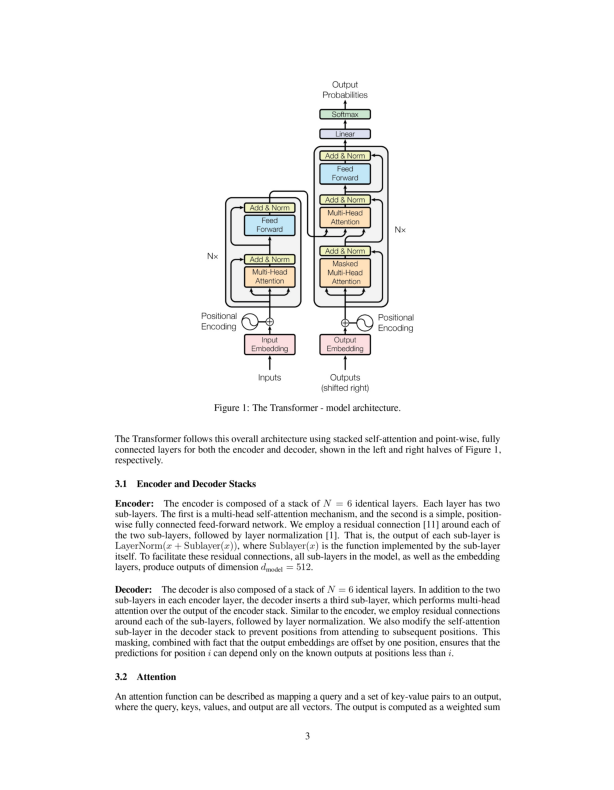

In [14]:
box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator(text_color=sv.Color.BLACK)

annotated_image = image.copy()
annotated_image = box_annotator.annotate(annotated_image, detections=detections)
annotated_image = label_annotator.annotate(annotated_image, detections=detections)

sv.plot_image(annotated_image, size=(10, 10))

# On Known Image

In [27]:
from ultralytics import YOLO
from PIL import Image
import requests

model = YOLO('yolo11n.pt')
image = Image.open('/content/autumn-trainor-vert.jpg')
result = model.predict(image, conf=0.25)[0]


0: 640x512 1 person, 1 car, 1 dog, 2 frisbees, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 512)


In [28]:
result.boxes.xyxy

tensor([[8.3835e+01, 1.1135e+02, 1.9266e+02, 2.0652e+02],
        [5.1206e+00, 3.6905e+01, 3.8349e+02, 4.2264e+02],
        [2.9087e+02, 2.2139e+02, 6.4740e+02, 7.8751e+02],
        [5.4810e+02, 5.5048e+02, 6.4836e+02, 6.2703e+02],
        [2.9590e-01, 4.7874e+02, 1.4605e+02, 6.8169e+02]], device='cuda:0')

In [29]:
result.boxes.conf

tensor([0.9410, 0.9204, 0.9049, 0.8989, 0.7535], device='cuda:0')

In [30]:
result.boxes.cls

tensor([29., 16.,  0., 29.,  2.], device='cuda:0')

In [31]:
detections = sv.Detections.from_ultralytics(result)
detections

Detections(xyxy=array([[     83.835,      111.35,      192.66,      206.52],
       [     5.1206,      36.905,      383.49,      422.64],
       [     290.87,      221.39,       647.4,      787.51],
       [      548.1,      550.48,      648.36,      627.03],
       [     0.2959,      478.74,      146.05,      681.69]], dtype=float32), mask=None, confidence=array([    0.94095,     0.92038,     0.90489,     0.89887,     0.75348], dtype=float32), class_id=array([29, 16,  0, 29,  2]), tracker_id=None, data={'class_name': array(['frisbee', 'dog', 'person', 'frisbee', 'car'], dtype='<U7')}, metadata={})

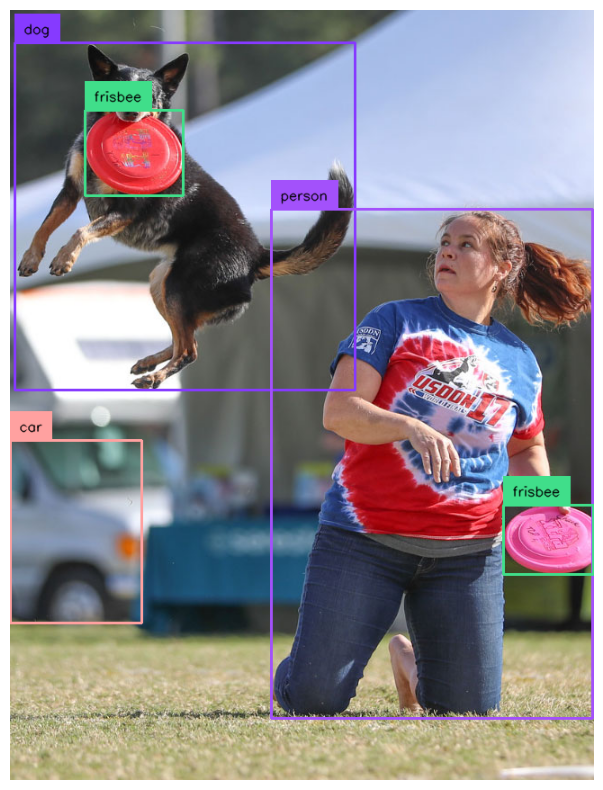

In [32]:
box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator(text_color=sv.Color.BLACK)

annotated_image = image.copy()
annotated_image = box_annotator.annotate(annotated_image, detections=detections)
annotated_image = label_annotator.annotate(annotated_image, detections=detections)

sv.plot_image(annotated_image, size=(10, 10))

## Fine-tune YOLO11 on custom dataset

In [36]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

from google.colab import userdata
from roboflow import Roboflow

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
rf = Roboflow(api_key=ROBOFLOW_API_KEY)

project = rf.workspace("huyifei").project("tft-id")
version = project.version(1)
dataset = version.download("yolov11")

mkdir: cannot create directory ‘/content/datasets’: File exists
/content/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to TFT-ID-1 in yolov11:: 100%|██████████| 17224/17224 [00:17<00:00, 978.50it/s] 


## Custom Training

In [37]:
dataset.location

'/content/datasets/TFT-ID-1'

In [38]:
%cd {HOME}

!yolo task=detect mode=train model=yolo11n.pt data={dataset.location}/data.yaml epochs=5 imgsz=640 plots=True

/content
Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/TFT-ID-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=

In [39]:
%cd {HOME}

!yolo task=detect mode=train model=yolo11n.pt data={dataset.location}/data.yaml epochs=10 imgsz=640 plots=True

/content
Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/datasets/TFT-ID-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pos

**NOTE:** The results of the completed training are saved in `{HOME}/runs/detect/train/`. Let's examine them.

In [40]:
!ls {HOME}/runs/detect/train/

args.yaml			 labels_correlogram.jpg  val_batch0_labels.jpg
BoxF1_curve.png			 labels.jpg		 val_batch0_pred.jpg
BoxP_curve.png			 results.csv		 val_batch1_labels.jpg
BoxPR_curve.png			 results.png		 val_batch1_pred.jpg
BoxR_curve.png			 train_batch0.jpg	 val_batch2_labels.jpg
confusion_matrix_normalized.png  train_batch1.jpg	 val_batch2_pred.jpg
confusion_matrix.png		 train_batch2.jpg	 weights


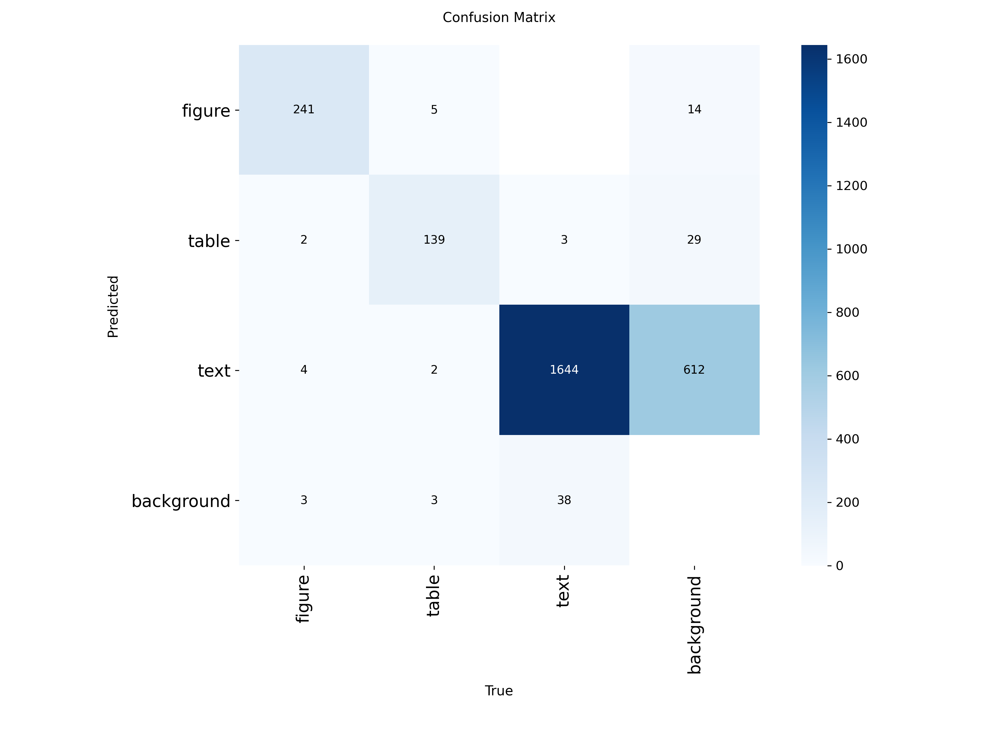

In [41]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

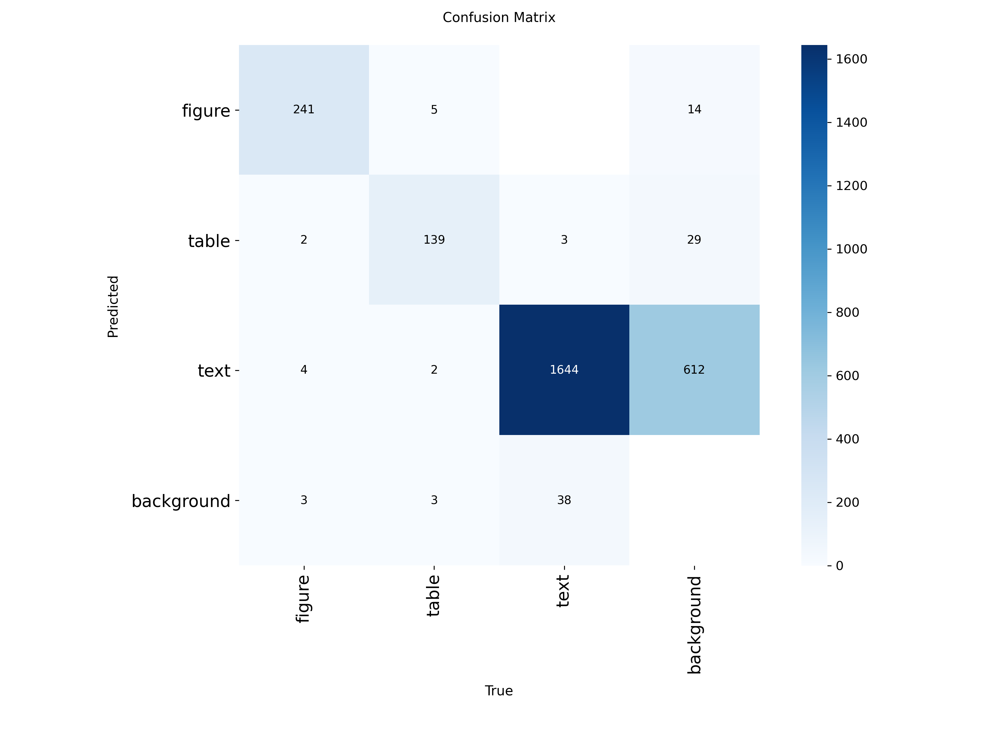

In [42]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

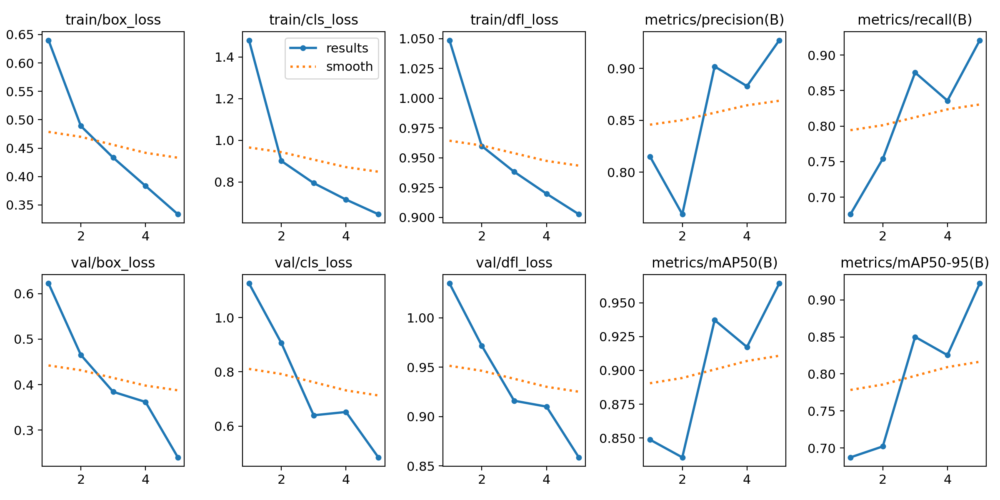

In [43]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/results.png', width=600)

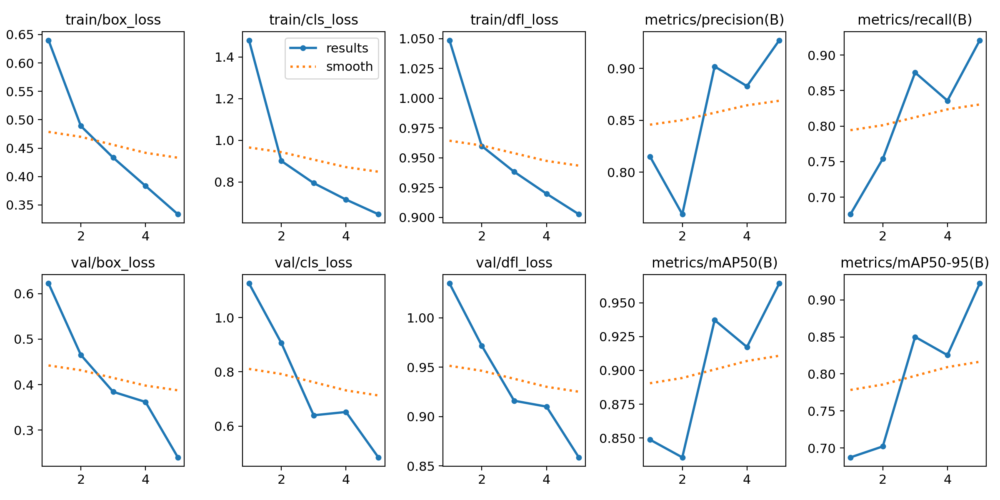

In [44]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/results.png', width=600)

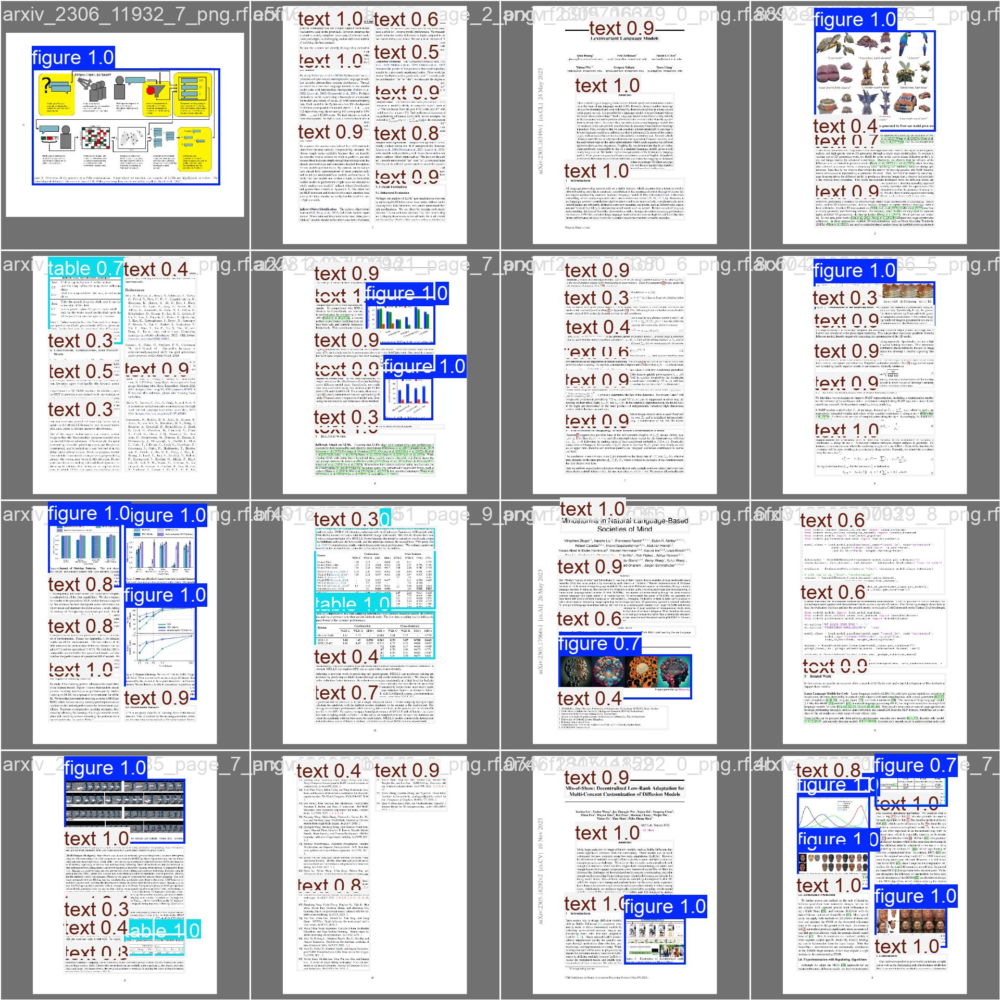

In [45]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=640)

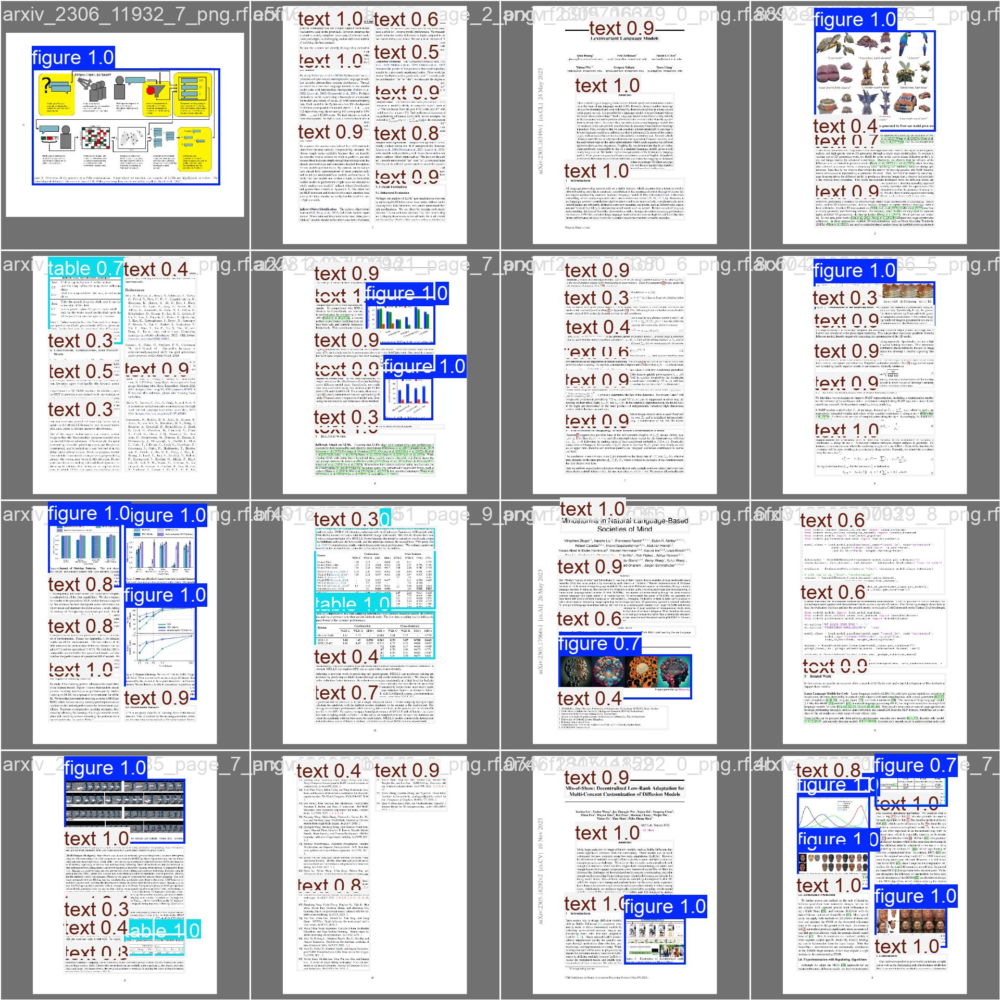

In [46]:
from IPython.display import Image as IPyImage

IPyImage(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=640)

## Validate fine-tuned model

In [47]:
!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2969.6±1886.3 MB/s, size: 512.3 KB)
val: Scanning /content/datasets/TFT-ID-1/valid/labels.cache... 431 images, 2 backgrounds, 0 corrupt: 100% 431/431 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 27/27 [00:08<00:00,  3.21it/s]
                   all        431       2084      0.928      0.921      0.964      0.923
                figure        196        250      0.972      0.948      0.984      0.957
                 table        106        149       0.92       0.94      0.958      0.937
                  text        422       1685       0.89      0.877      0.951      0.875
Speed: 1.0ms preprocess, 5.1ms inference, 0.0ms loss, 3.1ms postprocess per image
Results saved to runs/detect/val
💡 Learn more at http

## Inference with custom model

In [48]:
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.50 source={dataset.location}/test/images save=True

Ultralytics 8.3.176 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs

image 1/430 /content/datasets/TFT-ID-1/test/images/arxiv_2305_02412_3_png.rf.32f6409a183be4b92c631c71a6d780b9.jpg: 640x512 2 figures, 3 texts, 41.4ms
image 2/430 /content/datasets/TFT-ID-1/test/images/arxiv_2305_02412_7_png.rf.7b62359e54e4d3351b4b13cc753c08ec.jpg: 640x512 1 figure, 2 tables, 3 texts, 10.6ms
image 3/430 /content/datasets/TFT-ID-1/test/images/arxiv_2305_02665_4_png.rf.815a85a442d156cdad1178f7f6952bd4.jpg: 640x480 1 figure, 4 texts, 41.5ms
image 4/430 /content/datasets/TFT-ID-1/test/images/arxiv_2305_02968_3_png.rf.36f288a156a4db6c10e060bdd912bdf2.jpg: 640x512 1 figure, 4 texts, 9.3ms
image 5/430 /content/datasets/TFT-ID-1/test/images/arxiv_2305_03689_0_png.rf.772b06c466575a3872bd3ff29c72b9bd.jpg: 640x512 3 texts, 8.6ms
image 6/430 /content/datasets/TFT-ID-1/test/images/arxiv_2305_03981_7_png.rf.c9f67ee6cda1

**NOTE:** Let's take a look at few results.

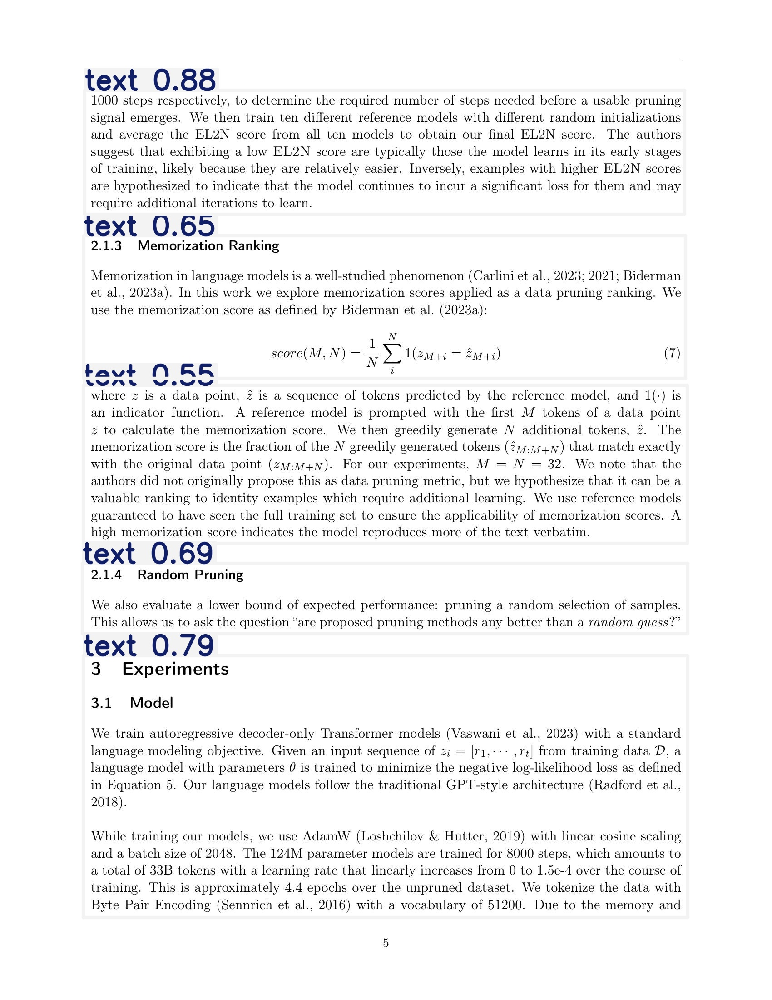

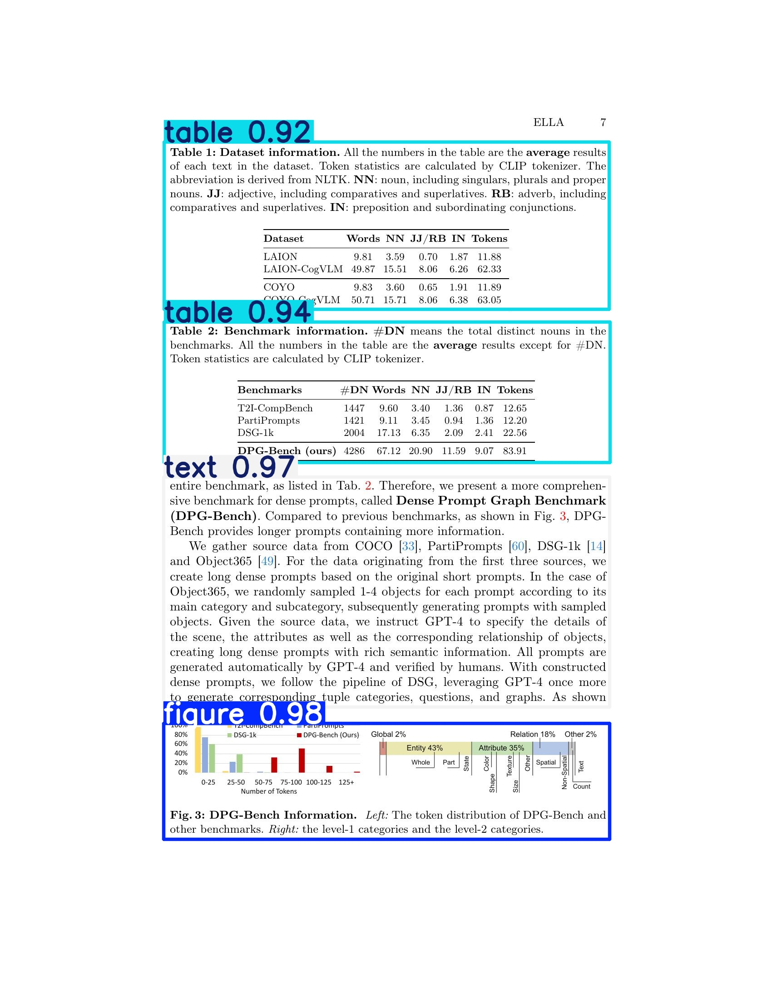

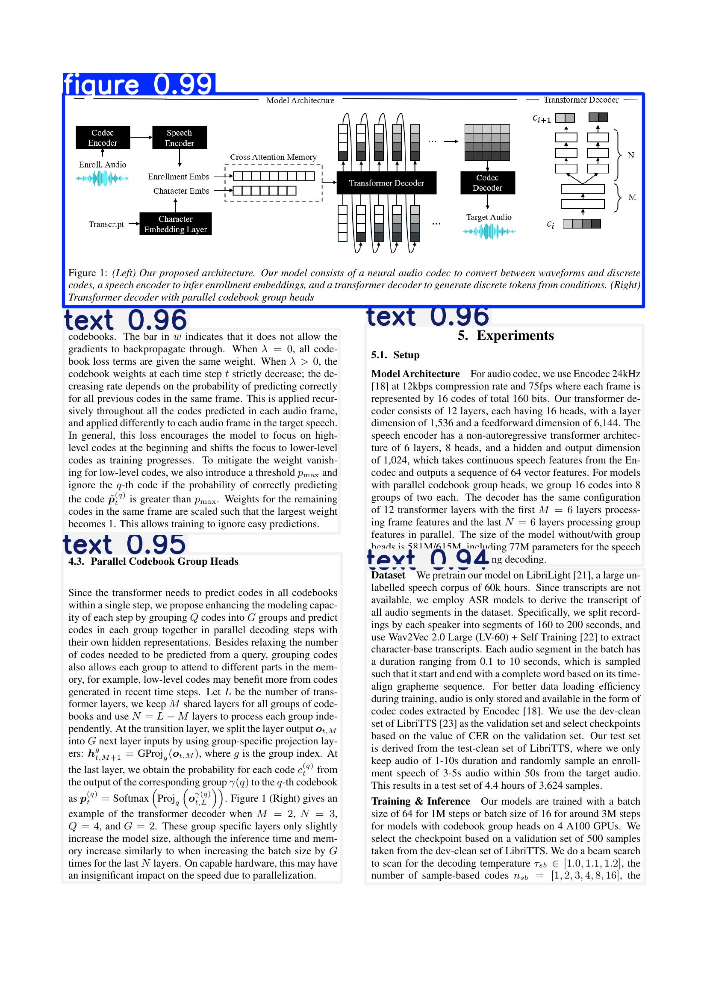

In [49]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[:3]:
    display(IPyImage(filename=img, width=600))
    print("\n")

# Load the model in new variable

In [50]:
from ultralytics import YOLO

# Load the custom model
model_loaded = YOLO('/content/runs/detect/train/weights/best.pt')

# Inference

Running inference on arxiv_2404_14239_3_png.rf.9f82425e8a3f71232487985f203c4751.jpg

0: 640x512 2 texts, 15.5ms
Speed: 3.2ms preprocess, 15.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 512)


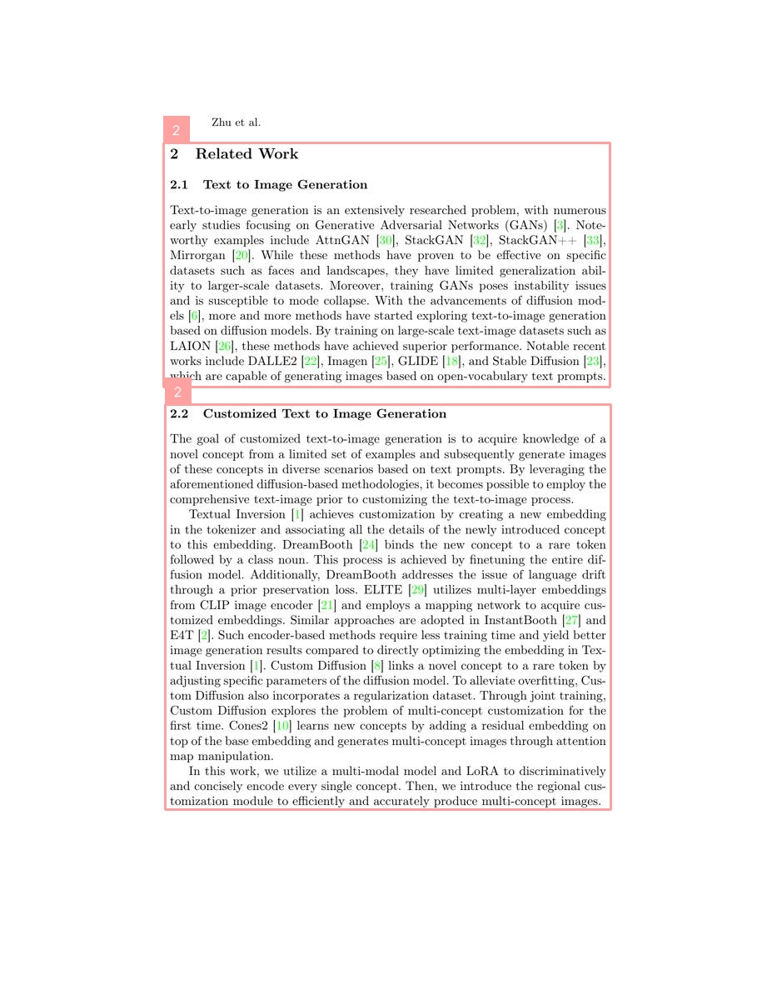

Running inference on arxiv_2402_03161_2_png.rf.bebe0e24070ac0ad396719bc38c602af.jpg

0: 640x512 1 figure, 3 texts, 13.4ms
Speed: 4.2ms preprocess, 13.4ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 512)


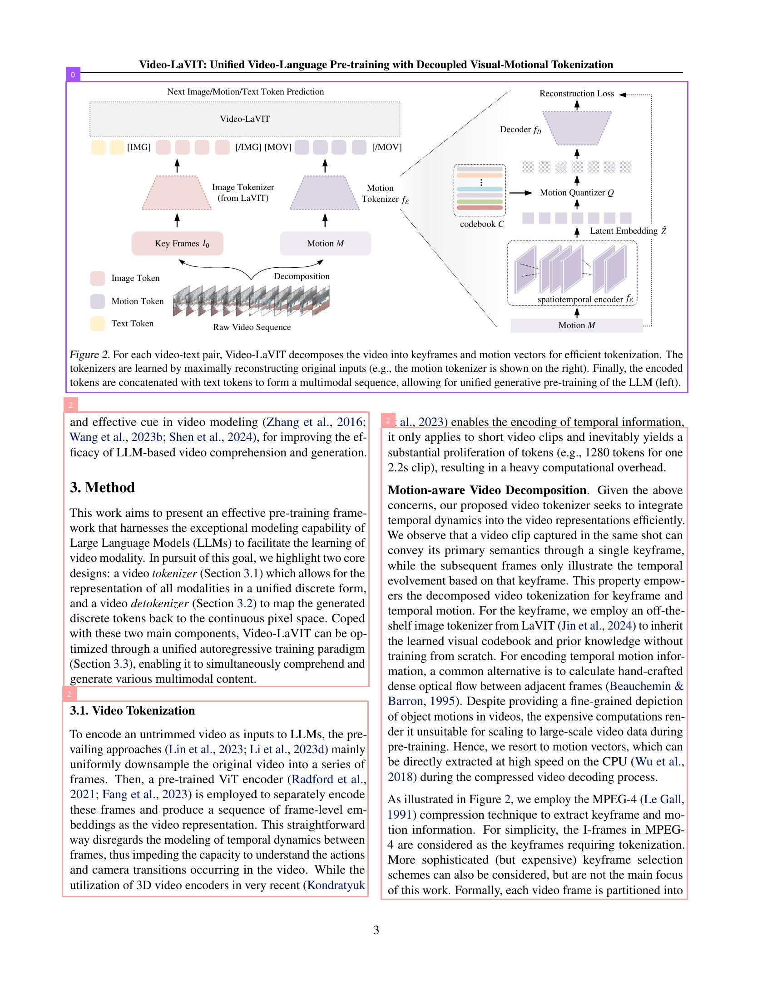

Running inference on arxiv_2406_14562_3_png.rf.e3b5a125abf7368af2b994d55bff141c.jpg

0: 640x480 1 figure, 1 table, 5 texts, 64.7ms
Speed: 4.1ms preprocess, 64.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 480)


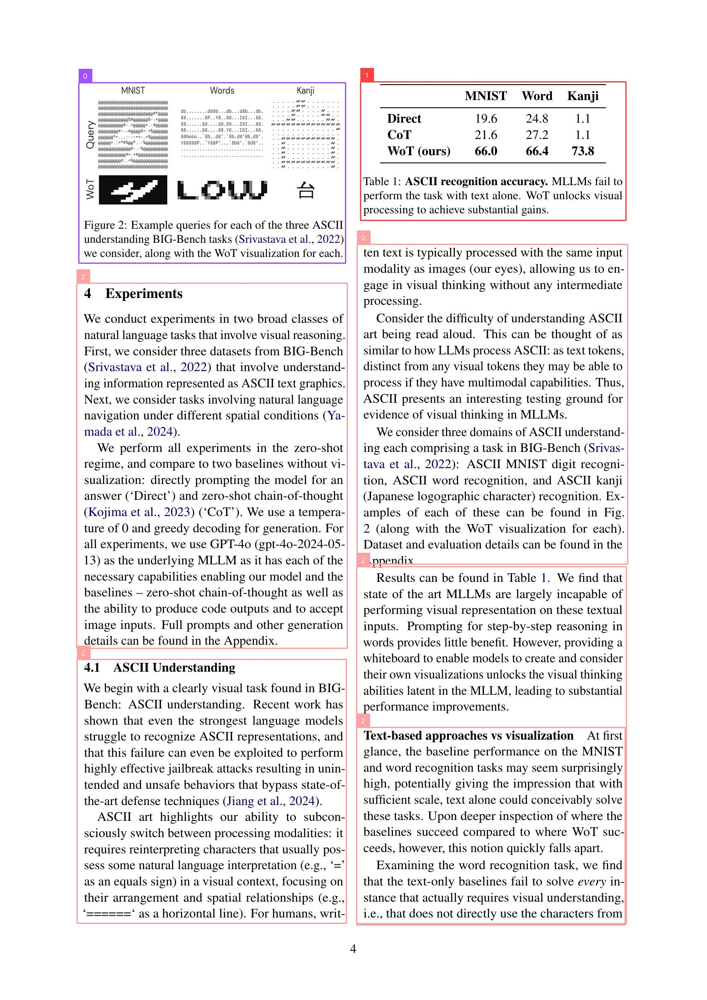

Running inference on arxiv_2306_05428_7_png.rf.43d8feb6022648b54920e06f4050677b.jpg

0: 640x512 1 figure, 1 table, 4 texts, 12.8ms
Speed: 4.9ms preprocess, 12.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)


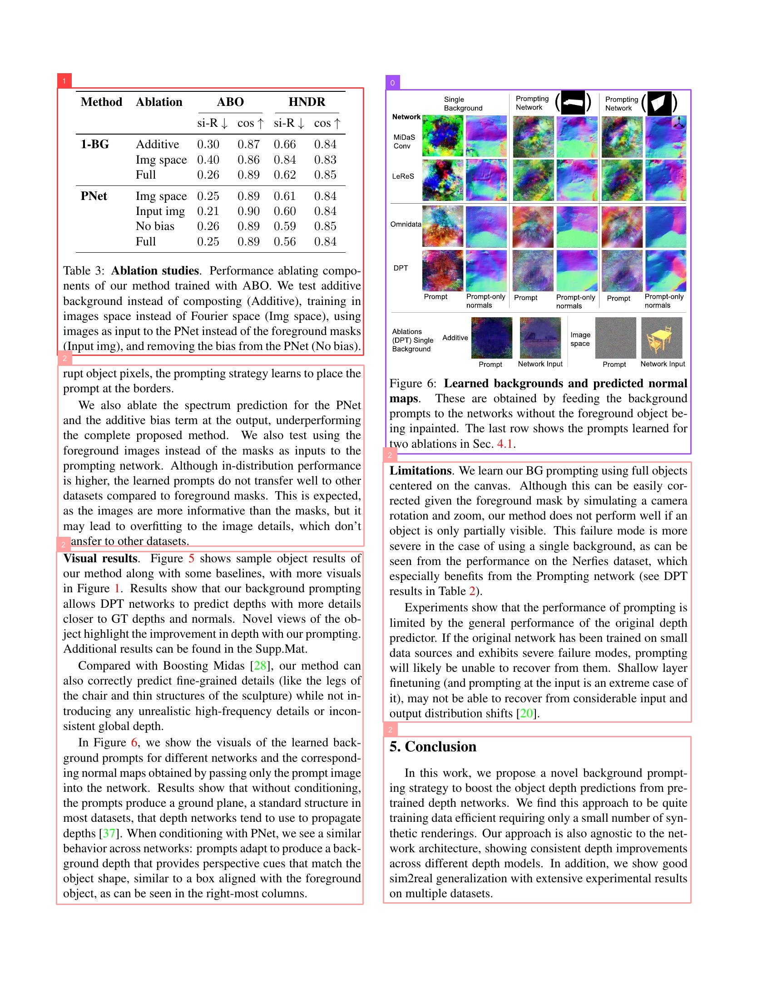

In [51]:
import os
import random
import cv2
import supervision as sv
import IPython
from ultralytics import YOLO

# Load the custom model
model_loaded = YOLO('/content/runs/detect/train/weights/best.pt')

# Assuming 'dataset' is defined earlier with a 'location' attribute
# If not, replace this with the actual path to your test images
test_set_loc = dataset.location + "/test/images/"
test_images = os.listdir(test_set_loc)

# Run inference on 4 random test images, or fewer if fewer images are available
for img_name in random.sample(test_images, min(4, len(test_images))):
    print("Running inference on " + img_name)

    # Load image
    image_path = os.path.join(test_set_loc, img_name)
    image = cv2.imread(image_path)

    # Perform inference (note: method changed from .infer() to .predict())
    results = model_loaded(image, conf=0.4)[0]  # Confidence threshold set to 0.4

    # Convert results to Supervision Detections
    detections = sv.Detections(
        xyxy=results.boxes.xyxy.cpu().numpy(),
        confidence=results.boxes.conf.cpu().numpy(),
        class_id=results.boxes.cls.cpu().numpy().astype(int)
    )

    # Annotate boxes and labels
    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    annotated_image = box_annotator.annotate(scene=image, detections=detections)
    annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

    # Display annotated image
    _, buffer = cv2.imencode('.jpg', annotated_image)
    i = IPython.display.Image(data=buffer)
    IPython.display.display(i)

# Inference on single image


0: 448x640 1 figure, 28.1ms
Speed: 3.5ms preprocess, 28.1ms inference, 2.3ms postprocess per image at shape (1, 3, 448, 640)


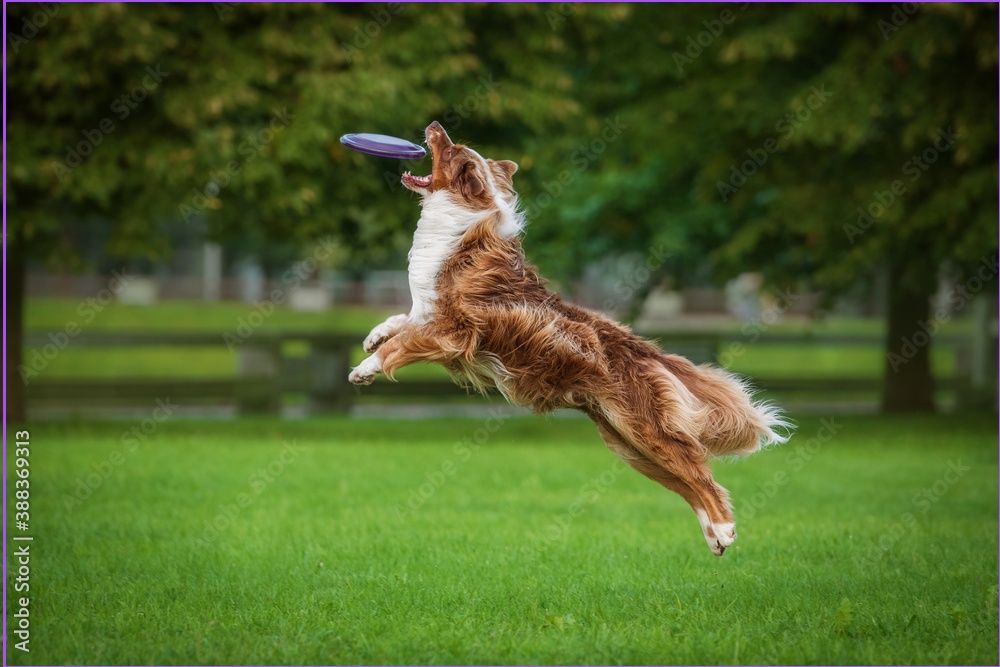

Number of detections: 1
Detection: figure, Confidence: 0.83, Coordinates: [     4.4367           0        1000         667]


In [53]:
import cv2
import supervision as sv
from ultralytics import YOLO
import IPython

# Load the custom model
model_loaded = YOLO('/content/runs/detect/train/weights/best.pt')

# Specify the path to your single image
image_path = '/content/1000_F_388369313_anfHrzK1Sh6pb5DbRT9S5mTP7I5zRwFs.jpg'  # Replace with your actual image path

# Load image
image = cv2.imread(image_path)

# Perform inference with labels
results = model_loaded(image, conf=0.50)[0]

# Create Detections with labels
detections = sv.Detections(
    xyxy=results.boxes.xyxy.cpu().numpy(),
    confidence=results.boxes.conf.cpu().numpy(),
    class_id=results.boxes.cls.cpu().numpy().astype(int)
)

# Get class names from the model
class_names = model_loaded.names

# Annotate boxes and labels with class names
box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator(
    text_scale=0.5,  # Adjust text size if needed
    text_thickness=1,  # Adjust text thickness  # You can customize color palette
)

# Annotate the image with detections and their labels
annotated_image = box_annotator.annotate(scene=image, detections=detections)
annotated_image = label_annotator.annotate(
    scene=annotated_image,
    detections=detections,
    labels=[f"{class_names[class_id]} {confidence:.2f}" for class_id, confidence in zip(detections.class_id, detections.confidence)]
)

# Display annotated image
_, buffer = cv2.imencode('.jpg', annotated_image)
i = IPython.display.Image(data=buffer)
IPython.display.display(i)

# Print detection details
print("Number of detections:", len(detections))
for box, conf, cls in zip(detections.xyxy, detections.confidence, detections.class_id):
    print(f"Detection: {class_names[cls]}, Confidence: {conf:.2f}, Coordinates: {box}")


0: 640x512 2 figures, 3 texts, 13.2ms
Speed: 3.3ms preprocess, 13.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 512)


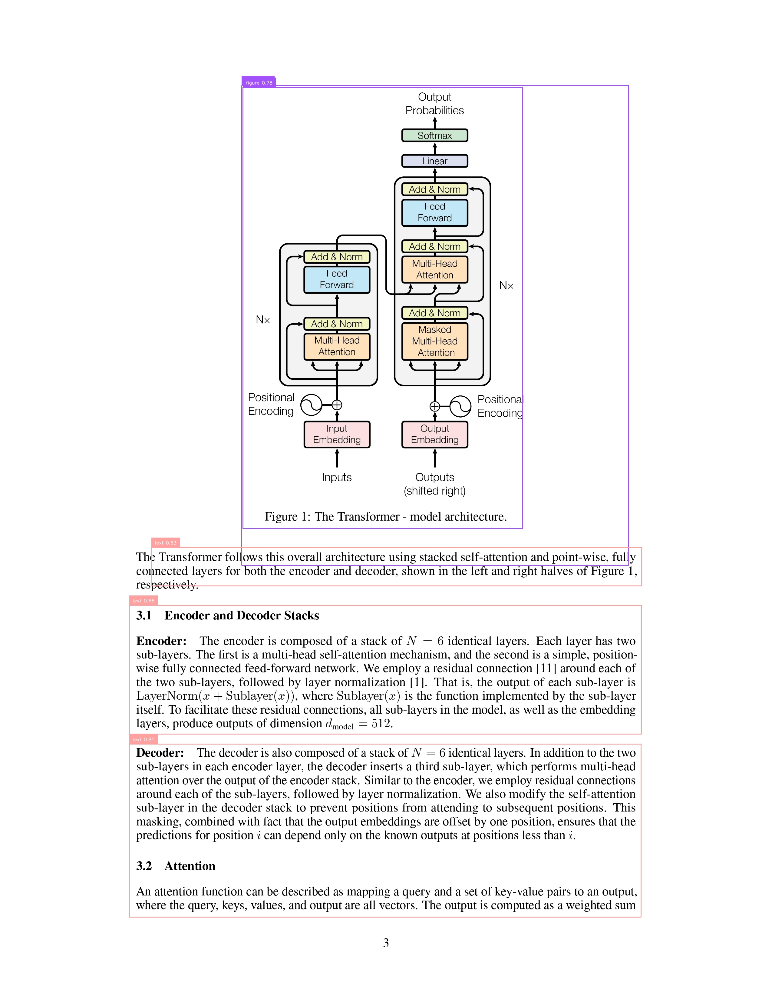

Number of detections: 5
Detection: figure, Confidence: 0.84, Coordinates: [     798.62      282.91      2076.9        1865]
Detection: text, Confidence: 0.81, Coordinates: [      427.2      2455.1      2117.1      3026.9]
Detection: figure, Confidence: 0.78, Coordinates: [     802.42      288.36      1726.7      1744.2]
Detection: text, Confidence: 0.66, Coordinates: [      427.9      1997.7      2118.4      2422.9]
Detection: text, Confidence: 0.63, Coordinates: [     500.54      1806.5      2119.8        1933]


In [56]:
import cv2
import supervision as sv
from ultralytics import YOLO
import IPython

# Load the custom model
model_loaded = YOLO('/content/runs/detect/train/weights/best.pt')

# Specify the path to your single image
image_path = '/content/1706.03762_page-0001.jpg'  # Replace with your actual image path

# Load image
image = cv2.imread(image_path)

# Perform inference with labels
results = model_loaded(image, conf=0.50)[0]

# Create Detections with labels
detections = sv.Detections(
    xyxy=results.boxes.xyxy.cpu().numpy(),
    confidence=results.boxes.conf.cpu().numpy(),
    class_id=results.boxes.cls.cpu().numpy().astype(int)
)

# Get class names from the model
class_names = model_loaded.names

# Annotate boxes and labels with class names
box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator(
    text_scale=0.5,  # Adjust text size if needed
    text_thickness=1,  # Adjust text thickness  # You can customize color palette
)

# Annotate the image with detections and their labels
annotated_image = box_annotator.annotate(scene=image, detections=detections)
annotated_image = label_annotator.annotate(
    scene=annotated_image,
    detections=detections,
    labels=[f"{class_names[class_id]} {confidence:.2f}" for class_id, confidence in zip(detections.class_id, detections.confidence)]
)

# Display annotated image
_, buffer = cv2.imencode('.jpg', annotated_image)
i = IPython.display.Image(data=buffer)
IPython.display.display(i)

# Print detection details
print("Number of detections:", len(detections))
for box, conf, cls in zip(detections.xyxy, detections.confidence, detections.class_id):
    print(f"Detection: {class_names[cls]}, Confidence: {conf:.2f}, Coordinates: {box}")